# Forest Cover Type Prediction - Baseline
The goal of this project is to build a model that uses cartographic features about a cell of forest land to accurately predict the predominant kind of tree cover for the cell.

## The Inference Problem
**X:** Cartographic fatures of forest land, such as elevation, slope, distance to water, shade, and soil type.

**y:** Predominant class of tree cover for the given cell.

**Model:** We will train a variety of models, including KNN, Naive Bayes, Decision Trees, and Others.

**Parameters:** Each of the different models will encode the training data via the parameters. KNN is the exception, and no parameters will be stored.

**Cost Functions:** Each model will employ a different cost function. For example, decision trees will use entropy.

**Objective:** Each of the models will have their own objective, like maximizing likelihood, in the case of Naivve bayes.

## [Data Source](https://www.kaggle.com/c/forest-cover-type-prediction)
The outcome variable (forest cover type) comes from the US Forest Service, while the feature variables come from a combination of the US Geological survey as well as the USFS. This data encapsulates four wilderness areas in the Roosevelt National Forest; because these areas are preserved from most human disturbance, we assume forest cover types are a result of natural processes represented by the independent variables (although this assumption is not necessary to generate an effective model).

## Feature Definitions
The raw data contains a mixture of continuous and binary variables, as defined below: 

- `Elevation` - Elevation in meters
- `Aspect` - Aspect in degrees azimuth
- `Slope` - Slope in degrees
- `Horizontal_Distance_To_Hydrology` - Horz Dist to nearest surface water features
- `Vertical_Distance_To_Hydrology` - Vert Dist to nearest surface water features
- `Horizontal_Distance_To_Roadways` - Horz Dist to nearest roadway
- `Hillshade_9am` (0 to 255 index) - Hillshade index at 9am, summer solstice
- `Hillshade_Noon` (0 to 255 index) - Hillshade index at noon, summer solstice
- `Hillshade_3pm` (0 to 255 index) - Hillshade index at 3pm, summer solstice
- `Horizontal_Distance_To_Fire_Points` - Horz Dist to nearest wildfire ignition points
- `Wilderness_Area` (4 binary columns, 0 = absence or 1 = presence) - Wilderness area designation
- `Soil_Type` (40 binary columns, 0 = absence or 1 = presence) - Soil Type designation
- `Cover_Type` (7 types, integers 1 to 7) - Forest Cover Type designation

Additional transformed variables to potentially train our models:
- `Wilderness_Area` - combining the 4 binary columns into one categorical variable (1-4), making an assumption about exclusivity of areas that needs to be checked
- `Soil_Type` - combining the 40 binary columns into one categorical variable (1-40), making an assumption about exclusivity of soil types that needs to be checked
- `Total_Distance_To_Hydrology` - Euclidean distance using "Horizontal" and "Vertical" distances
- Binned versions of continuous variables

## Testing Plan
We plan to tune and compare a variety of models, optimizing toward the highest possible $F_1$ score (a metric which balances precision and recall). All models will be trained on labeled data, and tested against "development" data using a 50-50 split. 

Potential models to test include:
- k Nearest Neighbors
- Naive Bayes
- Logistic Regression
- Decision Trees
- Support Vector Machines

## <a id = 0> </a>Navigation
- [Data Load](#1)
- [Data Split](#2)
- [Exploratory Data Analyses](#3)
    - [Histogram](#4)
    - [Scatter Plots](#5)
    - [Correlation Matrix](#6)
    - [Box Plots](#7)
    - [Violin Plots](#8)
    - [Wilderness Area and Soil Types](#9)
- [Confusion Matrix](#9.5)
- [Model Building](#10)
    - [SVC](#11)

## <a id = 1> </a> Data Load
[Back to Navigation](#0)

In [1]:
# # Install Kaggle from PIP
# !pip install kaggle

# # Import Kaggle
# import kaggle

# # Download the data via API
# !kaggle competitions download -c forest-cover-type-prediction

In [25]:
# General libraries
import numpy as np
import pandas as pd
import re
import time

# SK-learn - learning libraries
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.naive_bayes import BernoulliNB, MultinomialNB, GaussianNB
from sklearn.svm import SVC

# SK-learn - feature processing libraries
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# SK-learn - evaluation libraries
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn import metrics

# Plotting
import matplotlib.pyplot as plt
import seaborn as sns

# Producing Decision Tree diagrams
from IPython.display import Image, display
import pydotplus
from subprocess import call

# Other
import copy
from textwrap import wrap

# Expand rows/columns in df outputs
pd.set_option(
#     'max_rows', None, 
    'max_columns', None,
    'max_colwidth', None
)

In [3]:
# Load train and test csv files from Kaggle
train_kaggle = pd.read_csv('../data/raw/forest-cover-type-prediction/train.csv')
test_kaggle = pd.read_csv('../data/raw/forest-cover-type-prediction/test.csv')

In [4]:
print(
    f'Train Data Shape: {train_kaggle.shape}'
    f'\nTest Data Shape: {test_kaggle.shape}'
     )

Train Data Shape: (15120, 56)
Test Data Shape: (565892, 55)


## <a id = 2> </a> Data Split
[Back to Navigation](#0)

In [5]:
train_data = pd.read_csv('../data/processed/train_data.csv').set_index('Id')
train_labels = pd.read_csv('../data/processed/train_labels.csv').set_index('Id')
dev_data = pd.read_csv('../data/processed/dev_data.csv').set_index('Id')
dev_labels = pd.read_csv('../data/processed/dev_labels.csv').set_index('Id')

## <a id = 3> </a>Exploratory Data Analyses
[Back to Navigation](#0)

In [6]:
# Column List
train_data.columns

Index(['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology',
       'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways',
       'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm',
       'Horizontal_Distance_To_Fire_Points', 'Wilderness_Area1',
       'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4',
       'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5',
       'Soil_Type6', 'Soil_Type7', 'Soil_Type8', 'Soil_Type9', 'Soil_Type10',
       'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14',
       'Soil_Type15', 'Soil_Type16', 'Soil_Type17', 'Soil_Type18',
       'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22',
       'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26',
       'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30',
       'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34',
       'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38',
       'Soil_Type39', 'Soil_Type40

In [7]:
# Statistics Summary
train_data.describe()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
count,12096.000000,12096.000000,12096.000000,12096.000000,12096.000000,12096.000000,12096.000000,12096.000000,12096.000000,12096.000000,12096.000000,12096.000000,12096.000000,12096.000000,12096.000000,12096.000000,12096.000000,12096.000000,12096.000000,12096.000000,12096.0,12096.0,12096.000000,12096.000000,12096.000000,12096.000000,12096.000000,12096.000000,12096.0,12096.000000,12096.000000,12096.000000,12096.000000,12096.000000,12096.000000,12096.000000,12096.000000,12096.000000,12096.000000,12096.000000,12096.000000,12096.000000,12096.000000,12096.000000,12096.000000,12096.000000,12096.000000,12096.000000,12096.000000,12096.000000,12096.000000,12096.000000,12096.000000,12096.000000,12096.000000
mean,2749.726521,156.831845,16.520089,227.386574,51.023231,1717.758681,212.498760,218.965278,135.338542,1509.334077,0.236690,0.031581,0.423528,0.308201,0.024802,0.041584,0.062417,0.054894,0.010830,0.042989,0.0,0.0,0.000661,0.141617,0.028026,0.015046,0.031085,0.011243,0.0,0.007192,0.040509,0.004216,0.003307,0.009259,0.000909,0.022900,0.049769,0.016948,0.000083,0.003720,0.000992,0.000496,0.083581,0.048446,0.021743,0.046296,0.040757,0.001405,0.006448,0.000661,0.002149,0.048280,0.043899,0.030837,4.004051
std,417.449621,110.154121,8.446985,209.953696,61.388316,1322.600326,30.769027,22.804008,45.883196,1093.325968,0.425068,0.174888,0.494138,0.461769,0.155526,0.199645,0.241922,0.227783,0.103507,0.202842,0.0,0.0,0.025710,0.348671,0.165053,0.121742,0.173554,0.105441,0.0,0.084506,0.197158,0.064798,0.057413,0.095782,0.030144,0.149591,0.217475,0.129081,0.009092,0.060883,0.031483,0.022267,0.276770,0.214715,0.145848,0.210135,0.197736,0.037464,0.080046,0.025710,0.046314,0.214367,0.204878,0.172882,2.001504
min,1863.000000,0.000000,0.000000,0.000000,-146.000000,0.000000,0.000000,99.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,2376.000000,65.000000,10.000000,67.000000,5.000000,767.000000,196.000000,207.000000,107.000000,731.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
50%,2752.000000,126.000000,15.000000,180.000000,32.000000,1318.000000,220.000000,223.000000,138.000000,1253.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000
75%,3103.000000,261.000000,22.000000,330.000

In [12]:
# Check data types for each field
train_data.dtypes

Elevation                             int64
Aspect                                int64
Slope                                 int64
Horizontal_Distance_To_Hydrology      int64
Vertical_Distance_To_Hydrology        int64
Horizontal_Distance_To_Roadways       int64
Hillshade_9am                         int64
Hillshade_Noon                        int64
Hillshade_3pm                         int64
Horizontal_Distance_To_Fire_Points    int64
Wilderness_Area1                      int64
Wilderness_Area2                      int64
Wilderness_Area3                      int64
Wilderness_Area4                      int64
Soil_Type1                            int64
Soil_Type2                            int64
Soil_Type3                            int64
Soil_Type4                            int64
Soil_Type5                            int64
Soil_Type6                            int64
Soil_Type7                            int64
Soil_Type8                            int64
Soil_Type9                      

In [8]:
# Check null values
train_data.isna().sum()

Elevation                             0
Aspect                                0
Slope                                 0
Horizontal_Distance_To_Hydrology      0
Vertical_Distance_To_Hydrology        0
Horizontal_Distance_To_Roadways       0
Hillshade_9am                         0
Hillshade_Noon                        0
Hillshade_3pm                         0
Horizontal_Distance_To_Fire_Points    0
Wilderness_Area1                      0
Wilderness_Area2                      0
Wilderness_Area3                      0
Wilderness_Area4                      0
Soil_Type1                            0
Soil_Type2                            0
Soil_Type3                            0
Soil_Type4                            0
Soil_Type5                            0
Soil_Type6                            0
Soil_Type7                            0
Soil_Type8                            0
Soil_Type9                            0
Soil_Type10                           0
Soil_Type11                           0


**Observations**
- All data fields are int64 objects
- `Wilderness_Area` and `Soil_Type` are binary features
- `Cover_Type` is categorized from 1-7
- The rest of the fields are continuous
- No null values

### <a id = 4> </a>Histograms of each non-binary feature
[Back to Navigation](#0)

Given Random split between train and dev, we would expect the training distributions to compare similarly to our dev data. This will be key in in generalization both across Dev data, as well as final test data. 

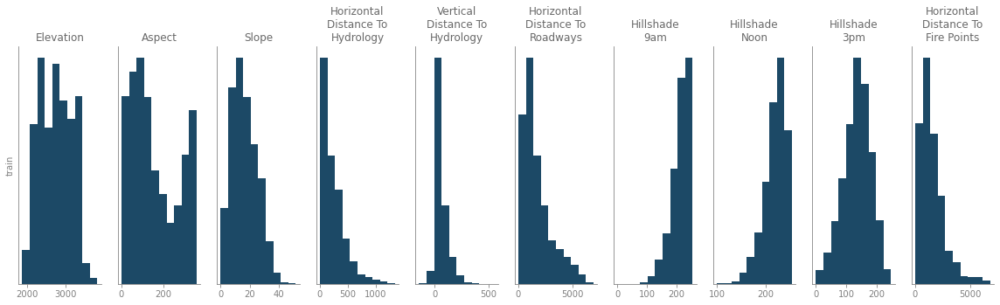

In [13]:
# Note: When you export this notebook and run it in Jupyter Lab, you need to
# reset the first column of test_kaggle as you did with train and test:
# test_data = test_kaggle.set_index('Id')
# Otherwise, the last row of graphs are one off

# Strip underscores from feature names for nice printing
formatted_cols = copy.deepcopy(X_train_df.columns).str.replace('_', ' ')

# Plot Formatting
plt.rcParams.update({'text.color' : "dimgrey",
                     'axes.labelcolor' : "grey"})

# include dev_data in plots for comparison
# datasets = [train_data, dev_data]    
# data_names = ['train', 'dev']

datasets = [X_train_df]
data_names = ['train']

# For Train, Dev, and Test, plot each non-binary feature
fig, axes = plt.subplots(1, 10)




# Loop through to show hist of non-binary for each 
for d, data in enumerate(datasets):    # For each dataset (only needed when comparing dev and train)
    for i in np.arange(0, 10):          # For each non-binary figure in dataset

        
        
        data.iloc[:, i].plot.hist(ax = axes[i], 
                                    figsize = (20,5), 
                                    sharex = True, color = '#1c4966')

        
        # Column and Row names for each plot
        if (i == 0) and (d == 0):    # Top Left Corner
            axes[i].set_ylabel(data_names[d])
            axes[i].set_title("\n".join(wrap(formatted_cols[i], 12)))
        
        elif i == 0:    # First Column
            axes[i].set_ylabel(data_names[d])
    
        elif d == 0:    # First Row
            axes[i].set_ylabel('')
            axes[i].set_title("\n".join(wrap(formatted_cols[i], 12)))
        else:
            axes[i].set_ylabel('')
            
        # For All Plots
        axes[i].set_yticks([])
        axes[i].spines['top'].set_visible(False)
        axes[i].spines['right'].set_visible(False)
        axes[i].spines['left'].set_color('grey')
        axes[i].spines['bottom'].set_color('grey')
        axes[i].tick_params(colors = 'grey')

plt.show()

### <a id = 5> </a> Scatterplots comparing each feature
[Back to Navigation](#0)

Scatterplots may reveal correlational relationships between features. Additionally, the color of each datapoint represents a forest cover type. This will also help reveal if the relationship between two features varies by forest cover type.

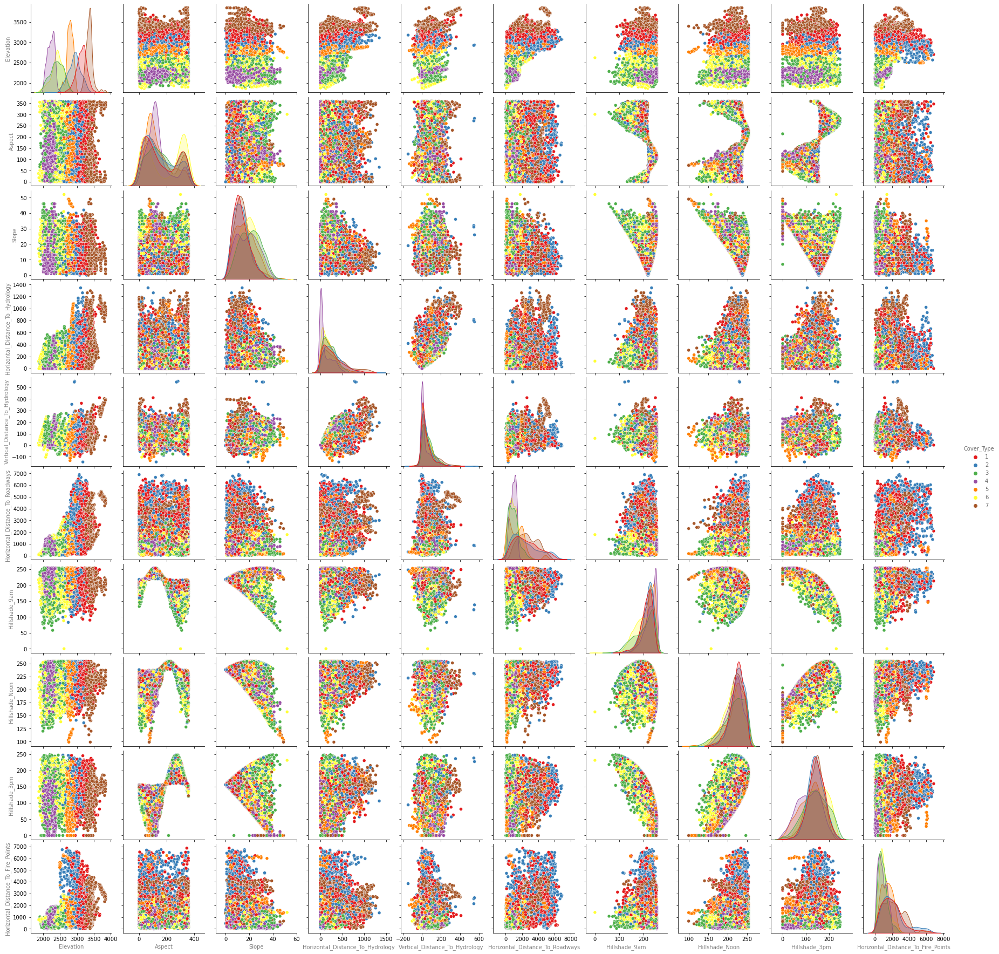

In [14]:
# Scatterplot Matrix
# ------------------------------------------------------------------------------
# This isn't meant to be a final output (obviously it's too much in its current
# state); just wanted to see all of the distributions at once so we could pick
# out meaningful ones 
# Currently, this takes a long time to run.

train_data_copy = X_train_df.copy().iloc[:, :10]
train_data_copy["Cover_Type"] = X_train_df.Cover_Type

# The different colors indicate Cover_Type
sns.pairplot(train_data_copy, kind="scatter", hue="Cover_Type", palette="Set1")
plt.show()

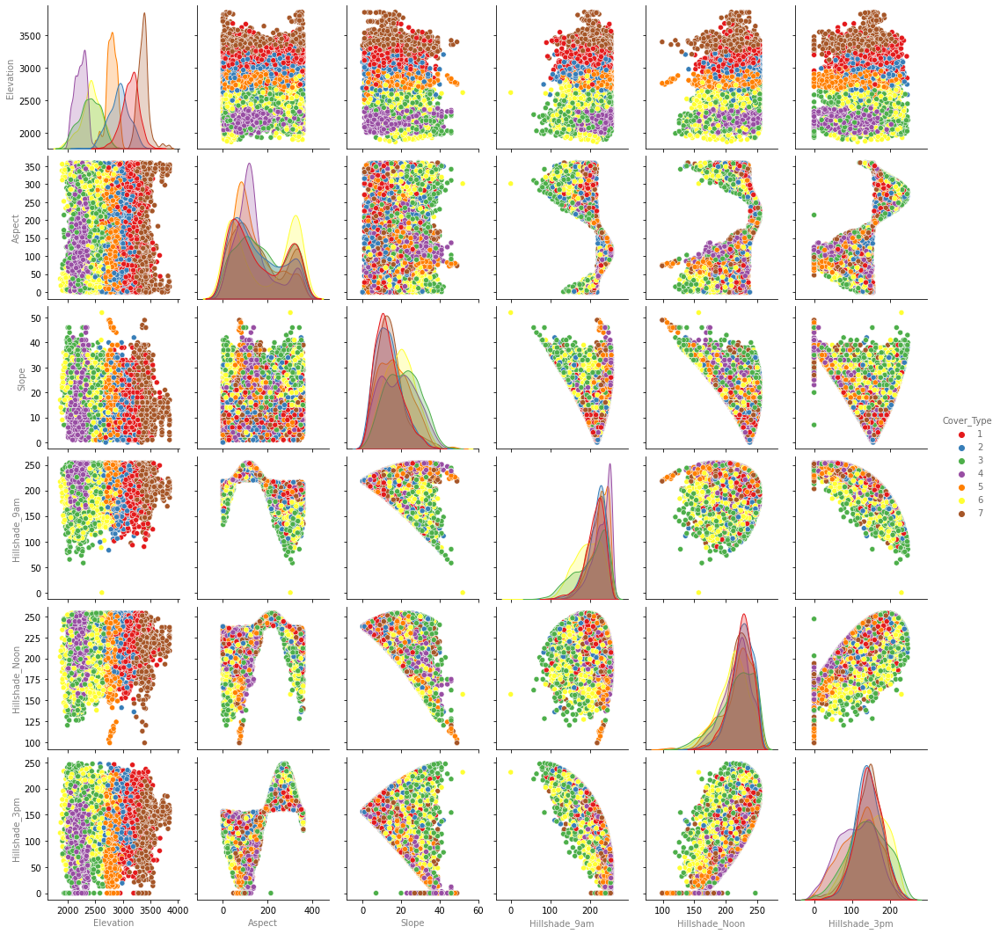

In [15]:
# Cutting down the number of columns
columns = ["Elevation", "Aspect", "Slope", "Hillshade_9am",
           "Hillshade_Noon", "Hillshade_3pm", "Cover_Type"]

train_data_copy2 = X_train_df.copy().loc[:, columns]
train_data_copy2

# The different colors indicate Cover_Type
sns.pairplot(train_data_copy2, kind="scatter", hue="Cover_Type", palette="Set1")
plt.show()

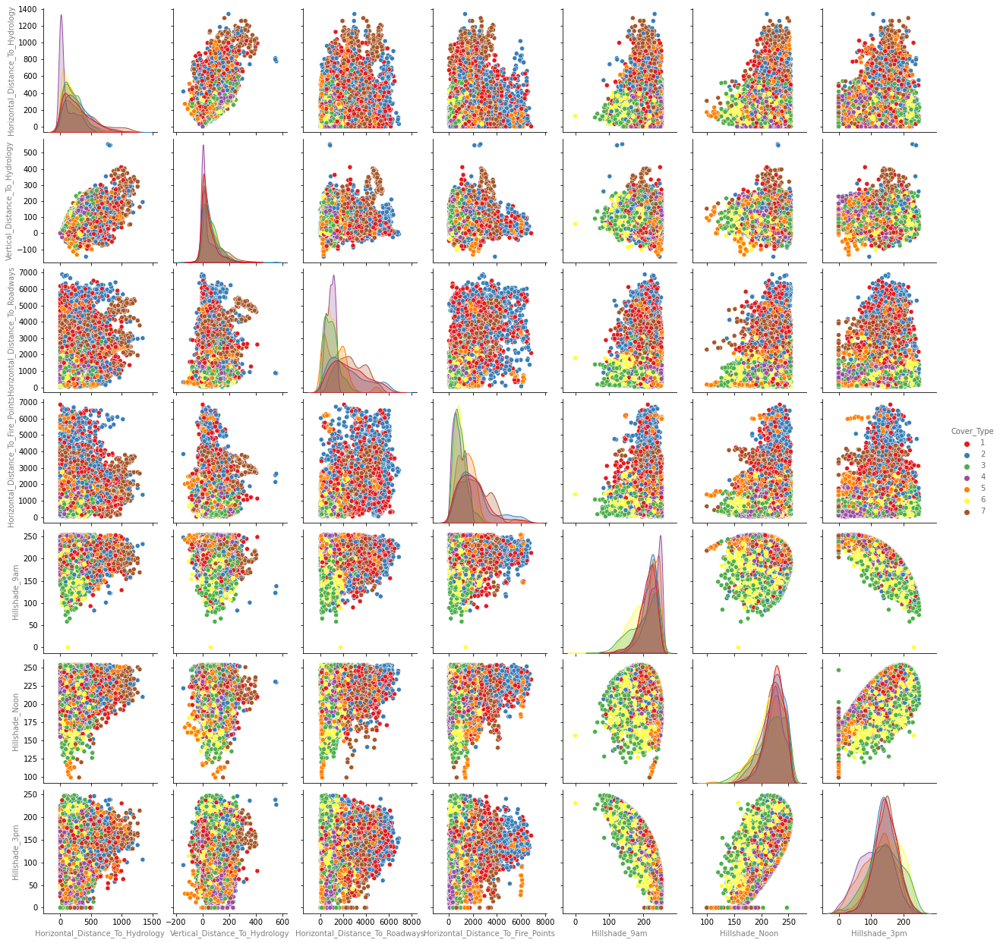

In [16]:
# Rest of the columns
columns = ["Horizontal_Distance_To_Hydrology",
           "Vertical_Distance_To_Hydrology", "Horizontal_Distance_To_Roadways",
           "Horizontal_Distance_To_Fire_Points", "Hillshade_9am",
           "Hillshade_Noon", "Hillshade_3pm", "Cover_Type"]

train_data_copy3 = X_train_df.copy().loc[:, columns]
train_data_copy3

# The different colors indicate Cover_Type
sns.pairplot(train_data_copy3, kind="scatter", hue="Cover_Type", palette="Set1")
plt.show()

### <a id = 6> </a>Correlation Matrix - Relationships between each non-binary feature
[Back to Navigation](#0)

Comparing the train_data heatmap to dev_data, it is evident that they have largely the same correlation structure. This is expected given the random 80/20 split, but it is important to note any deviations in structure will lead to poor generalization.

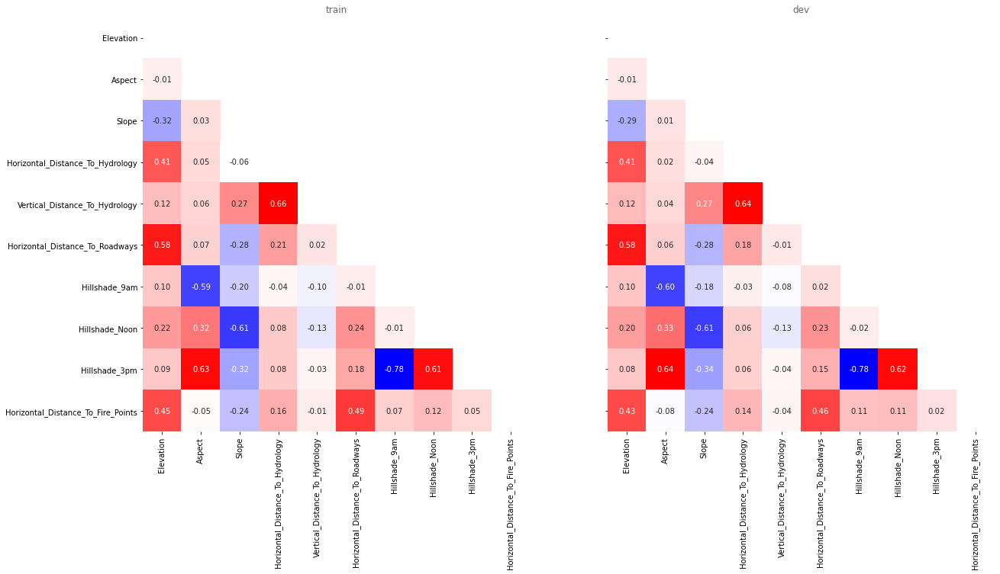

In [17]:
fig, axes = plt.subplots(1, 2, sharey = True, figsize = (20,10))

datasets = [X_train_df, X_dev_df]    
data_names = ['train', 'dev']

# Correlation plot for each dataset - numeric values
for i, data in enumerate(datasets):    # For each dataset

    corr = data.iloc[:, :10].corr()    # Set the correlation matrix
    
    # Mask to upper triangular
    mask = np.zeros_like(corr)
    mask[np.triu_indices_from(mask)] = True
    
    # Plot correlation heatmap
    sns.heatmap(corr, 
                xticklabels = corr.columns.values,
                yticklabels = corr.columns.values, 
                cmap = 'bwr', 
                annot = True, 
                mask = mask, 
                fmt = '.2f',
                ax = axes[i],
                cbar = False).set(title = data_names[i])

plt.show()

### <a id = 7> </a>Boxplots for Numeric Features
[Back to Navigation](#0)

Cartographic features like Elevation, Aspect, and Slope 

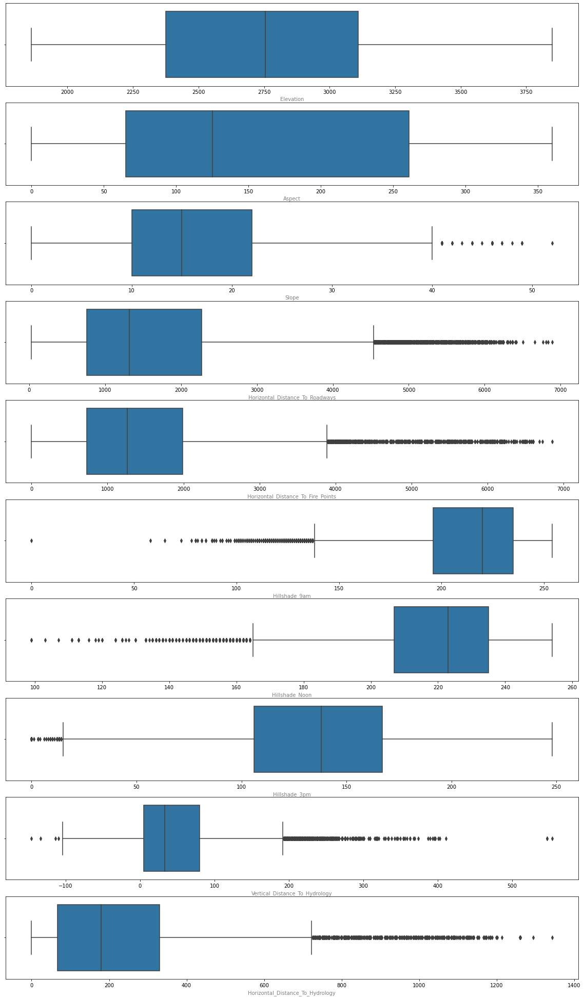

In [18]:
fig, ax = plt.subplots(10, 1, figsize = (20, 35))

feature_cols = ["Elevation", "Aspect", "Slope", 
                "Horizontal_Distance_To_Roadways", 
                "Horizontal_Distance_To_Fire_Points", "Hillshade_9am",
                "Hillshade_Noon", "Hillshade_3pm", 
                "Vertical_Distance_To_Hydrology", "Horizontal_Distance_To_Hydrology"] # Added these to feature_cols

for i, var in enumerate(feature_cols):
    sns.boxplot(x = var, data = X_train_df, ax = ax[i])
    
plt.show()

### <a id = 8> </a>Violin Plot on Continuous Features
[Back to Navigation](#0)

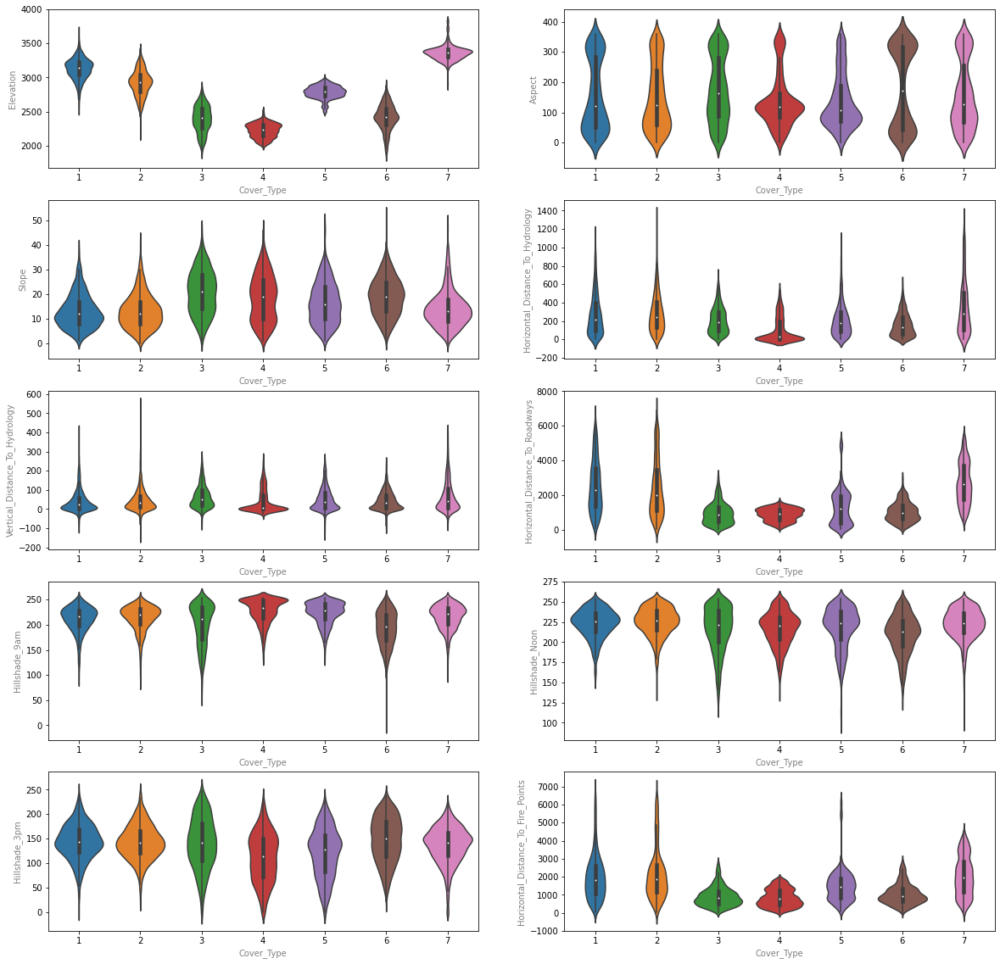

In [19]:
# Violin plot
fig, axes = plt.subplots(5, 2, figsize = (20, 20))
col_list = ['Elevation', 'Aspect', 'Slope',
            'Horizontal_Distance_To_Hydrology','Vertical_Distance_To_Hydrology', 
            'Horizontal_Distance_To_Roadways','Hillshade_9am',
            'Hillshade_Noon', 'Hillshade_3pm','Horizontal_Distance_To_Fire_Points']
i = 0
for col_name in col_list:
    row = i // 2
    col = i % 2
    sns.violinplot(x='Cover_Type', y=col_name, data=X_train_df , ax=axes[row][col])
    i = i + 1

**Observations**
- `Elevation` varies according to `Cover_Type` indicating that this will be an important variable for prediction
- `Horizontal_Distance_To_Hydrology` and `Horizontal_Distance_To_Roadways` have similar distributions

### <a id = 9> </a>`Wilderness_Area` and `Soil_Type` Binary Features Exploration
[Back to Navigation](#0)

Unpivot `Wilderness_Area` and `Soil_Type` Variables

In [20]:
soil_list = []
for i in range(40):
    soil_list.append(f'Soil_Type{i+1}')

wild_area_list = ['Wilderness_Area1','Wilderness_Area2','Wilderness_Area3','Wilderness_Area4']

In [21]:
# Unpivot df from wide to long format by combining `Soil_Type#` and `Wilderness_Area#` to one column each
X_train_df_comb = pd.melt(X_train_df, 
                          id_vars=col_list+soil_list+['Cover_Type'], 
                          value_vars=wild_area_list, 
                          var_name='Wilderness_Area')
X_train_df_comb2 = X_train_df_comb[X_train_df_comb.value != 0].drop(columns=['value'])

X_train_df_comb3 = pd.melt(X_train_df_comb2, 
                          id_vars=col_list+['Wilderness_Area', 'Cover_Type'], 
                          value_vars=soil_list, 
                          var_name='Soil_Type')
X_train_df_comb4 = X_train_df_comb3[X_train_df_comb3.value != 0].drop(columns=['value'])

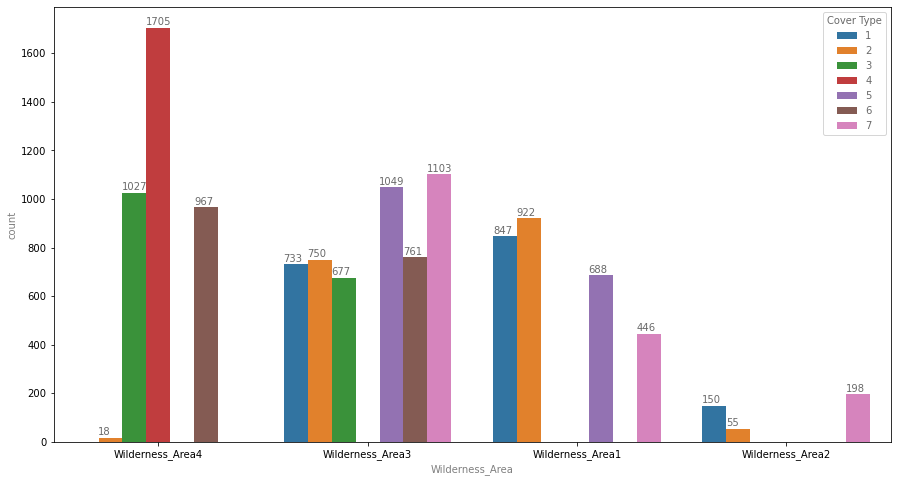

In [22]:
# Count plot - Combined Wilderness Area
plt.figure(figsize=(15, 8))
ax = sns.countplot(x='Wilderness_Area', hue='Cover_Type', data=X_train_df_comb4)
for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}', (p.get_x()-0.001, p.get_height()+10))
plt.legend(loc='upper right', title='Cover Type')
plt.show()

**Observations**
- Cover Type 4 only exists in Wilderness Area 4
- Fairly equal representation of wilderness areas, except for Wilderness Area 2

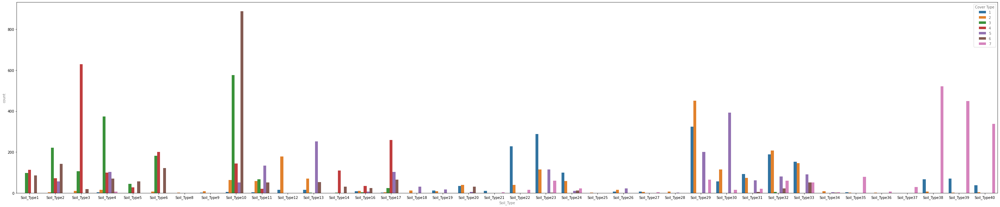

In [23]:
# Count plot - Soil Type
plt.figure(figsize=(50, 10))
ax = sns.countplot(x='Soil_Type', hue='Cover_Type', data=X_train_df_comb4)
# for p in ax.patches:
#     ax.annotate(f'{p.get_height():.0f}', (p.get_x(), p.get_height()+10))
plt.legend(loc='upper right', title='Cover Type')
plt.show()

**Observations**
- There are no cover types for Soil Type 7 and 15 

### Explore Wilderness Area Binary Counts
Fairly equal representation of wilderness areas, except for Wilderness Area 2

In [24]:
X_train_df.groupby(['Wilderness_Area1','Wilderness_Area2','Wilderness_Area3','Wilderness_Area4'])['Cover_Type'].count()

Wilderness_Area1  Wilderness_Area2  Wilderness_Area3  Wilderness_Area4
0                 0                 0                 1                   3717
                                    1                 0                   5073
                  1                 0                 0                    403
1                 0                 0                 0                   2903
Name: Cover_Type, dtype: int64

### Determining if one Soil type exists for each data point

In [25]:
# Determining if one soil type exists for each data point
soil_type_cols = [col_name for col_name in X_train_df.columns if 'Soil_Type' in col_name]

X_train_df_soil = X_train_df.copy()
X_train_df_soil['Soil_Type_Count'] = X_train_df_soil[soil_type_cols].sum(axis = 1)
X_train_df_soil['Soil_Type_Count'].value_counts()

# Only 1 soil type exists for each row - no mix of different soil types

1    12096
Name: Soil_Type_Count, dtype: int64

In [26]:
# try:
#     dev_data.drop(columns = 'Soil_Type_Count', axis = 1)
# except:
#     print('Soil_Type_Count not yet created')

X_dev_df_soil = X_dev_df.copy()
X_dev_df_soil['Soil_Type_Count'] = X_dev_df_soil[soil_type_cols].sum(axis = 1)
X_dev_df_soil['Soil_Type_Count'].value_counts()

1    3024
Name: Soil_Type_Count, dtype: int64


Looks like both Soil_Types and Wilderness_Areas are mutually exclusive within the columns (only 1 area/type per row)


In [27]:
# Wilderness Areas and Soil Types
# ------------------------------------------------------------------------------
# Combining wilderness areas into one column, soil types into one column

def get_feature_number(r, col_prefix):
  
  # gets the column name suffix of the true variable (wilderness area/soil type)
    cols = [col_name for col_name in r.index if (col_prefix in col_name) and re.search(r'\d', col_name) is not None]


    feature_subix = r[cols].argmax()

  #
    feature_name = cols[feature_subix]
    feature_num = ''.join([i for i in feature_name if i.isdigit()])
    return int(feature_num)

X_train_df_DR = X_train_df_soil.copy()
X_dev_df_DR = X_dev_df_soil.copy()

X_train_df_DR['Wilderness_Area'] = X_train_df_DR.apply(lambda x:get_feature_number(x, 'Wilderness_Area'), axis = 1)
X_train_df_DR['Soil_Type'] = X_train_df_DR.apply(lambda x:get_feature_number(x, 'Soil_Type'), axis = 1)
X_dev_df_DR['Wilderness_Area'] = X_dev_df_DR.apply(lambda x:get_feature_number(x, 'Wilderness_Area'), axis = 1)
X_dev_df_DR['Soil_Type'] = X_dev_df_DR.apply(lambda x:get_feature_number(x, 'Soil_Type'), axis = 1)

In [28]:
# Total_Distance_to_Hydrology
# ------------------------------------------------------------------------------
# Create Total_Distance_to_Hydrology based on Euclidean distance
X_train_df_DR['Total_Distance_To_Hydrology'] = np.sqrt(X_train_df_DR["Horizontal_Distance_To_Hydrology"]**2 + X_train_df_DR['Vertical_Distance_To_Hydrology']**2)
X_dev_df_DR['Total_Distance_To_Hydrology'] = np.sqrt(X_dev_df_DR["Horizontal_Distance_To_Hydrology"]**2 + X_dev_df_DR['Vertical_Distance_To_Hydrology']**2)
X_train_df_DR[["Total_Distance_To_Hydrology", "Horizontal_Distance_To_Hydrology", "Vertical_Distance_To_Hydrology"]].head(10)

,Total_Distance_To_Hydrology,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology
Id,,,
430,0.000000,0,0
11542,123.000000,120,27
10893,155.241747,150,40
3367,335.773733,330,62
8322,226.311732,201,104
15004,42.011903,42,-1
7981,973.572802,960,162
2336,273.578142,258,91
2785,172.104619,134,108


In [29]:
X_train_df_DR['Wilderness_Area'].value_counts()

3    5073
4    3717
1    2903
2     403
Name: Wilderness_Area, dtype: int64

In [30]:
X_train_df_DR['Soil_Type'].value_counts().sort_index().head()

1    296
2    494
3    764
4    671
5    128
Name: Soil_Type, dtype: int64

## <a id = 9.5> </a>Confusion Matrix 
[Back to Navigation](#0)

Gaussian NB

Gaussian NB f1_score: 0.6008

Confusion Matrix:
[[245  57   0   0  36   5  93]
 [118 167   9   1  94  21  24]
 [  0   9 159  90  52 113   0]
 [  0   0  37 368   0  50   0]
 [  6  81   2   0 304  32   0]
 [  0  15 100  61  41 211   0]
 [ 84   1   0   0   2   0 336]]


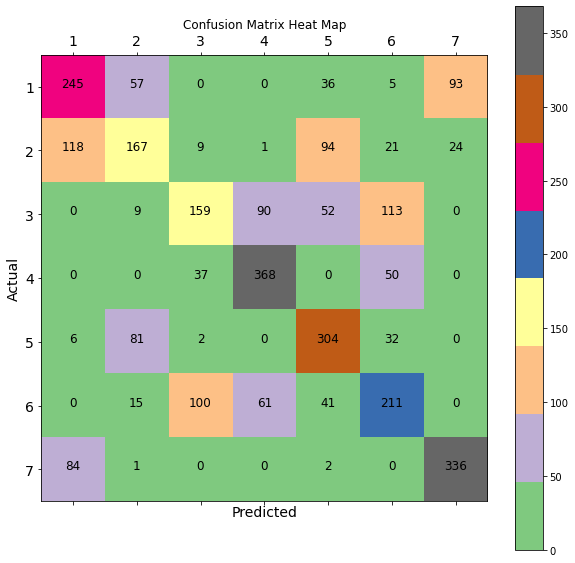

In [68]:
def gauss_NB_confusion_matrix():
    
    scaler = StandardScaler()
    X_train_std = scaler.fit_transform(train_data.iloc[:, :10])
    X_dev_std = scaler.transform(dev_data.iloc[:, :10])
    
    model = GaussianNB()
    model.fit(X_train_std, train_labels.values.ravel())
    dev_pred = model.predict(X_dev_std)
    
    nb_f1_score = metrics.f1_score(dev_pred, dev_labels, average = 'weighted')
    
    print(f'Gaussian NB f1_score: {nb_f1_score:.4f}\n')
    
    # Print confusion matrix in ASCII form
    conf_matrix = confusion_matrix(dev_labels, dev_pred)
    print('Confusion Matrix:')
    print(conf_matrix)
    
    # Produce confusion matrix in the form of heatmap
    fig = plt.figure(figsize=(10, 10))
    
    ax = fig.add_subplot(111)
    cmx = ax.matshow(conf_matrix, cmap=plt.cm.Accent)
    plt.colorbar(cmx)
    
    plt.title('Confusion Matrix Heat Map')
    plt.xlabel('Predicted', fontsize=14)
    plt.ylabel('Actual', fontsize=14)
    plt.imshow(conf_matrix, interpolation='nearest', cmap=plt.cm.Accent)
    classNames = [str(i+1) for i in range(conf_matrix.shape[0])]    
    tick_marks = np.arange(len(classNames))
    plt.xticks(tick_marks, classNames, rotation=0, fontsize=14)
    plt.yticks(tick_marks, classNames, fontsize=14)
   
    for i in range(len(classNames)):
        for j in range(len(classNames)):
            plt.text(j,i, str(conf_matrix[i][j]), size='large', horizontalalignment='center')    

gauss_NB_confusion_matrix()

## <a id = 10> </a>Model Building
[Back to Navigation](#0)

For the purposes of encapsulation and avoiding conflicts, each model cleaning/building is wrapped in a function. Eventually we will resolve conflicts and combine the tests.

### Obtain column index

In [32]:
column_name = 'Column Name'
dash = '-'*55
print(f'{dash}\n{column_name:<40s}Column Index\n{dash}')
for col_name in X_train_df.columns:
    print(f'{col_name:<40s}|{X_train_df.columns.get_loc(col_name)}')

-------------------------------------------------------
Column Name                             Column Index
-------------------------------------------------------
Elevation                               |0
Aspect                                  |1
Slope                                   |2
Horizontal_Distance_To_Hydrology        |3
Vertical_Distance_To_Hydrology          |4
Horizontal_Distance_To_Roadways         |5
Hillshade_9am                           |6
Hillshade_Noon                          |7
Hillshade_3pm                           |8
Horizontal_Distance_To_Fire_Points      |9
Wilderness_Area1                        |10
Wilderness_Area2                        |11
Wilderness_Area3                        |12
Wilderness_Area4                        |13
Soil_Type1                              |14
Soil_Type2                              |15
Soil_Type3                              |16
Soil_Type4                              |17
Soil_Type5                              |18
Soil_Type

In [33]:
# KNN Model 1

def knn():
#     feature_cols = ["Elevation", "Aspect", "Slope", "Total_Distance_To_Hydrology",
#                 "Horizontal_Distance_To_Roadways", "Soil_Type", "Wilderness_Area",
#                 "Horizontal_Distance_To_Fire_Points", "Hillshade_9am",
#                 "Hillshade_Noon", "Hillshade_3pm"]

#     X_train = train_data.loc[:, feature_cols]
#     X_dev = dev_data.loc[:, feature_cols]
#     Y_train = train_labels.Cover_Type
#     Y_dev = dev_labels.Cover_Type

    # K nearest neighbors cleaning/training/testing
    k_list = list(range(1, 11))
    for k in k_list:
        knn = KNeighborsClassifier(n_neighbors=k)
        knn.fit(X_train[:, :10], y_train.ravel())
        print("Accuracy for k =", k, ":", knn.score(X_dev[:, :10], y_dev))

knn()

Accuracy for k = 1 : 0.843584656084656
Accuracy for k = 2 : 0.8257275132275133
Accuracy for k = 3 : 0.8306878306878307
Accuracy for k = 4 : 0.8201058201058201
Accuracy for k = 5 : 0.8068783068783069
Accuracy for k = 6 : 0.7996031746031746
Accuracy for k = 7 : 0.7886904761904762
Accuracy for k = 8 : 0.781084656084656
Accuracy for k = 9 : 0.779431216931217
Accuracy for k = 10 : 0.7724867724867724


In [34]:
# Gaussian Naive Bayes
# -----------------------------------------------------------------------------
def naive_bayes1():
    # naive bayes cleaning/training/testing
    
    # Features to be used in model
    feature_cols = ["Elevation", "Aspect", "Slope", "Total_Distance_To_Hydrology",
                  "Horizontal_Distance_To_Roadways", "Soil_Type", "Wilderness_Area",
                  "Horizontal_Distance_To_Fire_Points", "Hillshade_9am",
                  "Hillshade_Noon", "Hillshade_3pm"]
    
    # Using StandardScalar() to normalize data
    scaler = StandardScaler()
    nX_train = scaler.fit_transform(X_train_df_DR.loc[:,feature_cols])
    nX_dev = scaler.transform(X_dev_df_DR.loc[:,feature_cols])
    #print(nX_train)

    # Create new dataframes with normalized values of data
    #nX_train = train_data.loc[:, feature_cols]
    #nX_dev = dev_data.loc[:, feature_cols]
    Y_train = y_train_df.Cover_Type
    Y_dev = y_dev_df.Cover_Type

    # Normalizing features
    #for feature in feature_cols:
        #nX_train[feature] = nX_train[feature] / np.max(nX_train[feature])
        #nX_dev[feature] = nX_dev[feature] / np.max(nX_dev[feature])

    # Generating initial model
    #smoothing_list = [0.00001, 0.0001, 0.001, 0.01, 0.1, 1]
    #for num in smoothing_list:

    model = GaussianNB(var_smoothing=0.001)
    model.fit(nX_train, Y_train)

    # Print the results
    print('Initial Accuracy:', model.score(nX_dev, Y_dev), '\n')

    # Adjusting sigma to test results
    print("Mean sigma:", np.mean(model.sigma_), '\n')

    sigma = 0.7
    model.sigma_ = np.full((7,11), sigma)
    # Print the results
    print('Accuracy for constant sigma =', sigma, ':', model.score(nX_dev, Y_dev), '\n\n')

naive_bayes1()

Initial Accuracy: 0.621031746031746 

Mean sigma: 0.7109256990462991 

Accuracy for constant sigma = 0.7 : 0.5125661375661376 




In [35]:
# Bernoulli Naive Bayes
# ---------------------------------------------------------------------------
def naive_bayes2():

    # Features to be used in model
    feature_cols = ["Elevation", "Aspect", "Slope", "Total_Distance_To_Hydrology",
                    "Horizontal_Distance_To_Roadways", "Soil_Type", "Wilderness_Area",
                    "Horizontal_Distance_To_Fire_Points", "Hillshade_9am",
                    "Hillshade_Noon", "Hillshade_3pm"]

    # Create new dataframes with normalized values of data
    X_train = X_train_df_DR.loc[:, feature_cols]
    X_dev = X_dev_df_DR.loc[:, feature_cols]
    y_train = y_train_df.Cover_Type
    y_dev = y_dev_df.Cover_Type

    # Finding mean of each column and appending to list
    mean_list = []
    for feature in feature_cols:
        mean_list.append(np.mean(X_train[feature]))

    # Taken from Week 3 Tutorial
    # Define a function that applies a threshold to turn real valued forest features into 0/1 features.
    # 0 will mean "short" and 1 will mean "long".
    def binarize_data(data, feature_cols, thresholds=mean_list):
        
        # Initialize a new feature array with the same shape as the original data.
        binarized_data = data.copy()

        # Apply a threshold  to each feature.
        i = 0
        for feature in feature_cols:
            binarized_data[feature] = binarized_data[feature] > thresholds[i]
            i+=1
        return binarized_data

    # Create new binarized training and test data
    binarized_train_data = binarize_data(X_train, feature_cols)
    binarized_dev_data = binarize_data(X_dev, feature_cols)

    # Model using default binarization
    model = BernoulliNB()
    model.fit(X_train, y_train)
    pred_y_dev = model.predict(X_dev)

    # Print the results
    print("Results for Bernoulli Naive Bayes Models...\n\n")
    print('Initial Accuracy:',
          model.score(X_dev, y_dev), '\n')
    print('Initial F1 Score:',
          metrics.f1_score(pred_y_dev, y_dev, average = 'weighted'),'\n')

    # Model using adjusted binarization
    model2 = BernoulliNB()
    model2.fit(binarized_train_data, y_train)
    pred_y_dev = model2.predict(binarized_dev_data)

    # Print the results
    print('Accuracy after adjusted feature binarization:',
          model2.score(binarized_dev_data, y_dev), '\n')
    print('F1 Score after adjusted feature binarization:',
          metrics.f1_score(pred_y_dev, y_dev, average = 'weighted'),'\n\n')

naive_bayes2()

Results for Bernoulli Naive Bayes Models...


Initial Accuracy: 0.2003968253968254 

Initial F1 Score: 0.28451213579985724 

Accuracy after adjusted feature binarization: 0.4494047619047619 

F1 Score after adjusted feature binarization: 0.47458191911256303 




In [36]:
# Multinomial Naive Bayes
# ---------------------------------------------------------------------------
def naive_bayes3():

    # Features to be used in model
    feature_cols = ["Elevation", "Aspect", "Slope", "Total_Distance_To_Hydrology",
                    "Horizontal_Distance_To_Roadways", "Soil_Type", "Wilderness_Area",
                    "Horizontal_Distance_To_Fire_Points", "Hillshade_9am",
                    "Hillshade_Noon", "Hillshade_3pm"]

    # Create new dataframes with normalized values of data
    X_train = X_train_df_DR.loc[:, feature_cols]
    X_dev = X_dev_df_DR.loc[:, feature_cols]
    y_train = y_train_df.Cover_Type
    y_dev = y_dev_df.Cover_Type

    # Finding mean of each column and appending to list
    mean_list = []
    for feature in feature_cols:
        mean_list.append(np.mean(X_train[feature]))

    # Taken from Week 3 Tutorial
    # Define a function that applies a threshold to turn real valued forest features into 0/1 features.
    # 0 will mean "short" and 1 will mean "long".
    def binarize_data(data, feature_cols, thresholds=mean_list):
        
        # Initialize a new feature array with the same shape as the original data.
        binarized_data = data.copy()

        # Apply a threshold  to each feature.
        i = 0
        for feature in feature_cols:
            binarized_data[feature] = binarized_data[feature] > thresholds[i]
            i+=1
        return binarized_data

    # Create new binarized training and test data
    binarized_train_data = binarize_data(X_train, feature_cols)
    binarized_dev_data = binarize_data(X_dev, feature_cols)

    # Model using default binarization
    model = MultinomialNB()
    model.fit(X_train, y_train)
    pred_y_dev = model.predict(X_dev)

    # Print the results
    print("Results for Multinomial Naive Bayes Models...\n\n")
    print('Initial Accuracy:',
          model.score(X_dev, y_dev), '\n')
    print('Initial F1 Score:',
          metrics.f1_score(pred_y_dev, y_dev, average = 'weighted'),'\n')

    # Model using adjusted binarization
    model2 = MultinomialNB()
    model2.fit(binarized_train_data, y_train)
    pred_y_dev = model2.predict(binarized_dev_data)

    # Print the results
    print('Accuracy after adjusted feature binarization:',
          model2.score(binarized_dev_data, y_dev), '\n')
    print('F1 Score after adjusted feature binarization:',
          metrics.f1_score(pred_y_dev, y_dev, average = 'weighted'),'\n\n')

naive_bayes3()

Results for Multinomial Naive Bayes Models...


Initial Accuracy: 0.3039021164021164 

Initial F1 Score: 0.3156208867544632 

Accuracy after adjusted feature binarization: 0.4113756613756614 

F1 Score after adjusted feature binarization: 0.42569078915864933 




In [37]:
def logistic_regression():
    # log regression cleaning/training/testing

    feature_cols = ["Elevation", "Slope", "Total_Distance_To_Hydrology","Horizontal_Distance_To_Roadways", 
                  "Horizontal_Distance_To_Fire_Points", "Hillshade_9am","Hillshade_Noon", "Hillshade_3pm"] + [
                      col for col in X_train_df_DR.columns if re.search(r'\d+$', col) is not None]
    standardizer = StandardScaler()
    X_train = X_train_df_DR.loc[:, feature_cols]
    nX_train = standardizer.fit_transform(X_train)
    X_dev = X_dev_df_DR.loc[:, feature_cols]
    nX_dev = standardizer.transform(X_dev)
    y_train = y_train_df.Cover_Type
    y_dev = y_dev_df.Cover_Type
    
    params = {'C': [.1, 1, 10, 50, 100, 200, 500, 1000]}
    gscv = GridSearchCV(LogisticRegression(max_iter = 10000), param_grid=params, scoring='accuracy')
    gscv.fit(nX_train, y_train)
    
    cv_results = pd.DataFrame(gscv.cv_results_)
    print(cv_results.loc[:,['params', 'mean_test_score', 'rank_test_score']])
    print('Best Params:',gscv.best_params_)
    best_c_value = gscv.best_params_['C']
    clf = LogisticRegression(C=best_c_value, max_iter = 10000)

    clf.fit(nX_train, y_train)
    pred_y_train = clf.predict(nX_train)
    pred_y_dev = clf.predict(nX_dev)
    f1_score_train = metrics.f1_score(pred_y_train, y_train, average = 'weighted')
    f1_score_dev = metrics.f1_score(pred_y_dev, y_dev, average = 'weighted')
    accuracy_train = clf.score(nX_train, y_train)
    accuracy_dev = clf.score(nX_dev, y_dev)

    print("F1 Score for Train Data: %.4f" %f1_score_train,
        "\nF1 Score for Dev Data: %.4f" %f1_score_dev, "\n")
    print("Accuracy for Train Data: %.4f" %accuracy_train,
        "\nAccuracy for Dev Data: %.4f" %accuracy_dev, "\n")

logistic_regression()

        params  mean_test_score  rank_test_score
0   {'C': 0.1}         0.681795                8
1     {'C': 1}         0.702050                7
2    {'C': 10}         0.702795                6
3    {'C': 50}         0.703208                5
4   {'C': 100}         0.703373                1
5   {'C': 200}         0.703373                1
6   {'C': 500}         0.703291                3
7  {'C': 1000}         0.703291                3
Best Params: {'C': 100}
F1 Score for Train Data: 0.7116 
F1 Score for Dev Data: 0.7085 

Accuracy for Train Data: 0.7082 
Accuracy for Dev Data: 0.7034 



In [38]:
# Define DT funciton

def decision_trees():

    # Removing labels and new column from dataset - Not permanent
    train_data2 = X_train_df_DR.copy().drop(columns = ['Cover_Type', 'Soil_Type_Count', 'Soil_Type'])
    dev_data2 = X_dev_df_DR.copy().drop(columns = ['Cover_Type', 'Soil_Type_Count', 'Soil_Type'])

    
    # decision tree cleaning/training/testing
    dt = DecisionTreeClassifier(criterion = 'entropy', max_leaf_nodes = 50)
    dt.fit(train_data2, y_train_df)
    
    y_pred = dt.predict(dev_data2)
    
    print('Accuracy:', dt.score(dev_data2, y_dev_df))
    print('F1 Score after adjusted binarization:', metrics.f1_score(y_pred, y_dev_df, average = 'weighted'),'\n\n')

    # Print Decision Tree
    export_graphviz(dt, out_file = 'dot_data.dot')

    call(['dot', '-Tpng', 'dot_data.dot', '-o', 'dot_data.png', '-Gdpi=600'])

    display(Image(filename='dot_data.png'))

decision_trees()

Accuracy: 0.6875
F1 Score after adjusted binarization: 0.6936909096532237 




## <a id = 11> </a>svc
[Back to Navigation](#0)

## SVC - np

In [39]:
train_data_minmax = MinMaxScaler().fit_transform(X_train[:, :10])
dev_data_minmax = MinMaxScaler().fit_transform(X_dev[:, :10])

train_data_std = StandardScaler().fit_transform(X_train[:, :10])
dev_data_std = StandardScaler().fit_transform(X_dev[:, :10])

In [40]:
# # GridSearchCV best parameters
# # This will take 5 minutes to run
# # Not necessary to run

# def best_svc(params):
#     gscv = GridSearchCV(SVC(), param_grid=params, scoring='accuracy')
#     gscv.fit(train_data_std, y_train.ravel())
    
#     df = pd.DataFrame(gscv.cv_results_)
# #     print(df.loc[:,['params', 'mean_test_score', 'rank_test_score']])    
#     return gscv

# params = {'C': [1, 10, 100, 1000],
#           'gamma': [1, 0.5, 0.1, 0.01],
#           'kernel': ['rbf']}

# best_svm = best_svc(params)

# print(f'\nBest SVC parameters: {best_svm.best_params_}')

In [41]:
# svm = SVC(
#     C=best_svm.best_params_['C']
#     ,gamma=best_svm.best_params_['gamma']
#     ,kernel=best_svm.best_params_['kernel']
#          )
svm = SVC(
    C=10
    ,gamma=0.5
    ,kernel='rbf'
    ,random_state=0
         )

# svm.fit(train_data_minmax, y_train.ravel())
# dev_prediction = svm.predict(dev_data_minmax)

svm.fit(train_data_std, y_train.ravel())
dev_prediction = svm.predict(dev_data_std)

print(f'Best f1-score for SVC: {metrics.f1_score(y_dev, dev_prediction, average="weighted"):.4f}\n')
print(classification_report(y_dev, dev_prediction))

Best f1-score for SVC: 0.7901

              precision    recall  f1-score   support

           1       0.77      0.66      0.71       449
           2       0.60      0.62      0.61       412
           3       0.75      0.73      0.74       439
           4       0.91      0.94      0.92       412
           5       0.84      0.91      0.87       453
           6       0.75      0.73      0.74       436
           7       0.91      0.97      0.94       423

    accuracy                           0.79      3024
   macro avg       0.79      0.79      0.79      3024
weighted avg       0.79      0.79      0.79      3024



## SVC - df

In [42]:
df_train_data_minmax = MinMaxScaler().fit_transform(X_train_df.iloc[:, :10])
df_dev_data_minmax = MinMaxScaler().fit_transform(X_dev_df.iloc[:, :10])

df_train_data_std = StandardScaler().fit_transform(X_train_df.iloc[:, :10])
df_dev_data_std = StandardScaler().fit_transform(X_dev_df.iloc[:, :10])

In [43]:
# def best_svc(params):
#     gscv = GridSearchCV(SVC(), param_grid=params, scoring='accuracy')
# #     gscv.fit(df_train_data_minmax, train_labels_df.values.ravel())
#     gscv.fit(df_train_data_std, y_train_df.values.ravel())
    
#     df = pd.DataFrame(gscv.cv_results_)
# #     print(df.loc[:,['params', 'mean_test_score', 'rank_test_score']])
    
#     return gscv

# params = {'C': [1, 10, 100, 1000],
#           'gamma': [1, 0.5, 0.1, 0.01],
#           'kernel': ['rbf']}

# best_svm = best_svc(params)

# print(f'\nBest SVC parameters: {best_svm.best_params_}')

In [44]:
# svm = SVC(
#     C=best_svm.best_params_['C']
#     ,gamma=best_svm.best_params_['gamma']
#     ,kernel=best_svm.best_params_['kernel']
#          )

svm = SVC(
    C=10
    ,gamma=0.5
    ,kernel='rbf'
    ,random_state=0
         )

# svm.fit(df_train_data_minmax, train_labels_df.values.ravel())
# dev_prediction = svm.predict(df_dev_data_minmax)

svm.fit(df_train_data_std, y_train_df.values.ravel())
dev_prediction = svm.predict(df_dev_data_std)

print(f'Best f1-score for SVC: {metrics.f1_score(y_dev_df, dev_prediction, average="weighted"):.4f}\n')
print(classification_report(y_dev_df, dev_prediction))

Best f1-score for SVC: 0.7855

              precision    recall  f1-score   support

           1       0.70      0.67      0.69       430
           2       0.65      0.58      0.61       415
           3       0.75      0.70      0.73       456
           4       0.92      0.94      0.93       455
           5       0.84      0.93      0.88       423
           6       0.73      0.76      0.74       432
           7       0.88      0.94      0.91       413

    accuracy                           0.79      3024
   macro avg       0.78      0.79      0.78      3024
weighted avg       0.78      0.79      0.79      3024

